## Level Set Method for Image Segmentation

The method is based on the paper **Retina Image Vessel Segmentation Using a Hybrid CGLI Level Set Method** by Chen et al.

**Note:** The Gaussian convolution used in the paper is replaced with a heat equation using FFT.

In [35]:
%load_ext autoreload

# Import libararies
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from scipy.fftpack import dct, idct # for Fourier transforms
from nptyping import NDArray, Float64
from lsm import *
from scipy.ndimage.filters import gaussian_filter # For a Gaussian blur

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Performing an image segmentation with lsm function and a given image.

In [36]:
# A function that runs the level set method with a given image.
def run_lsm(image, lsm, step_size=1, max_iter=10, print_every=10, do_plot=True):

    
    for outer_iter in range(max_iter):
        # initianlize phi
        lsm.phi[lsm.phi<0]  =  -lsm.rho
        lsm.phi[lsm.phi>=0] =   lsm.rho

        # apply heat equation
        lsm.phi = lsm.conv(lsm.phi)

        # compute f1 and f2
        lsm.compute_local_bin_value(image)

        # compute c1 and c2
        lsm.compute_the_region_average_intensity(image)

        # Compute Spf
        lsm.compute_the_local_global_force(image)

        # compute |\nabla phi|
        lsm.compute_absolute_gradient()

        # update phi
        lsm.update_phi(step_size, image)
        
        # print iteration and show images if do_plot == True
        if(print_every > 0):
            if(outer_iter % print_every == 0):
                print("Iter: {:3d}".format(outer_iter))
                if do_plot:
                    fig,ax = plt.subplots(1,2,figsize=(10,5))
                    ax[0].imshow(image, 'bone')
                    ax[0].set_title("Image")
                    ax[1].contour(np.flipud(lsm.phi),[0])
                    ax[1].set_title("iter: {:3d}".format(outer_iter))
                    plt.tight_layout()
                    plt.show()
    return lsm.phi

Plotting the result image at the end.

In [37]:
# Plotting tool
def plot_result(original_image, phi):
    newim = np.zeros_like(phi)
    phinew = lsm.conv(phi, 1e-7)
    newim[phinew<0]= 1

    x = np.linspace(0.5/n1, 1 - 0.5/n1, n1)
    y = np.linspace(0.5/n2, 1 - 0.5/n2, n2)

    x, y = np.meshgrid(x,y)

    # Plot the result
    fig, ax = plt.subplots(1,3,figsize=(15,5))
    ax[0].imshow(original_image, 'bone')
    ax[0].set_title("Original Image")
    ax[1].contour(x,y,np.flipud(phinew), [0], cmap='hot')
    ax[1].set_title("Contour of a level set function")

    ax[2].imshow(newim, cmap='bone')
    ax[2].set_title("Area of $\\{ x \\in \\Omega: \\phi(x) < 0 \\}$")
    plt.tight_layout()
    plt.show()

## Setting the parameters

In [38]:
# Define the size
n1 = 1024
n2 = 1024

# Paramters for a level set method
rho = 1        # No need to modify this. It doesn't affect the result very much.
sigma   = 1e-7 # A parameter for a convolution. Higher the value, lesser the noise and lower the accuracy.
omega   = 0.2  # A ratio of gG and gL functions. gL + omega * gG.
epsilon = 0.2  # A paramter for a H_epsilon function.

## Create a lsm object

In [39]:
# Create a lsm object
lsm = LSM(n1,n2,rho,sigma,omega,epsilon)

## Running the method on multiple images

Here are step by step processes of running the level set method on each image.

1. Import an image.
2. Preprocess.
    1. resize an image into (n2, n1)
    2. apply a Gaussian filter
3. Initialize phi.
4. Run a method.

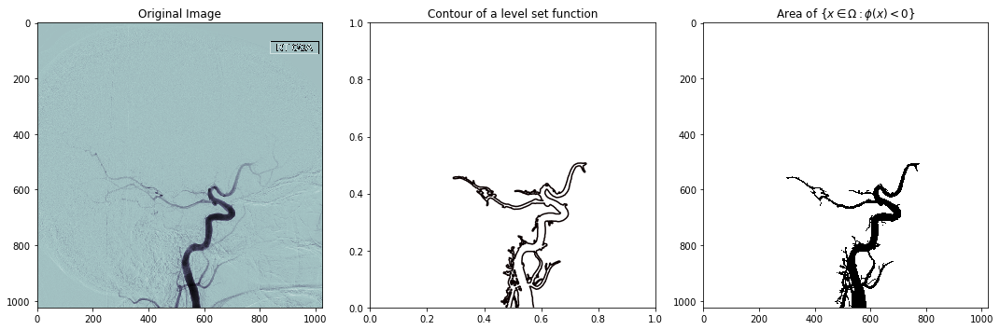

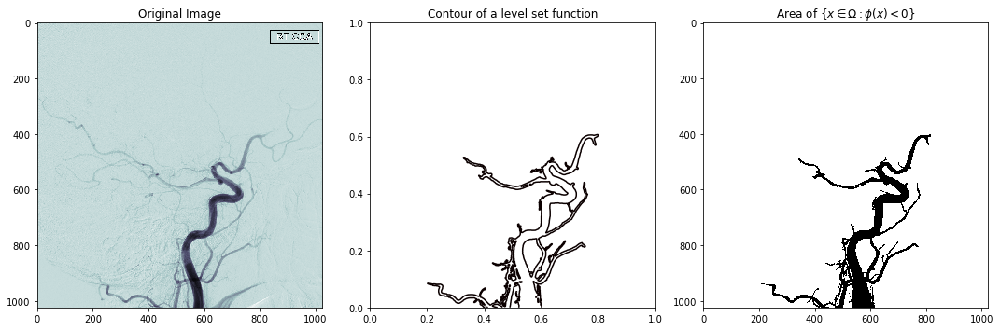

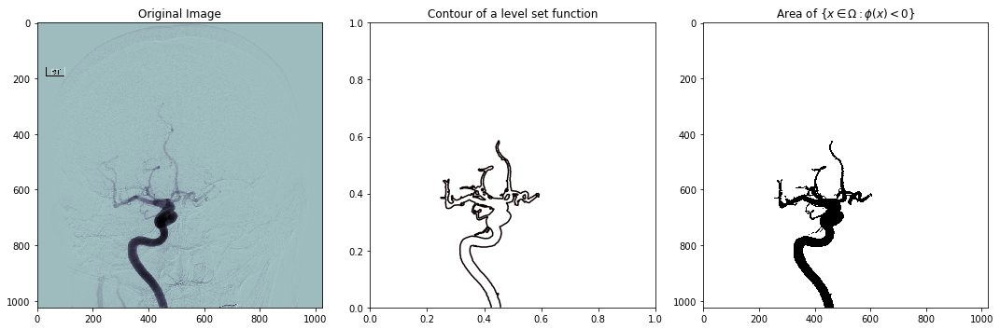

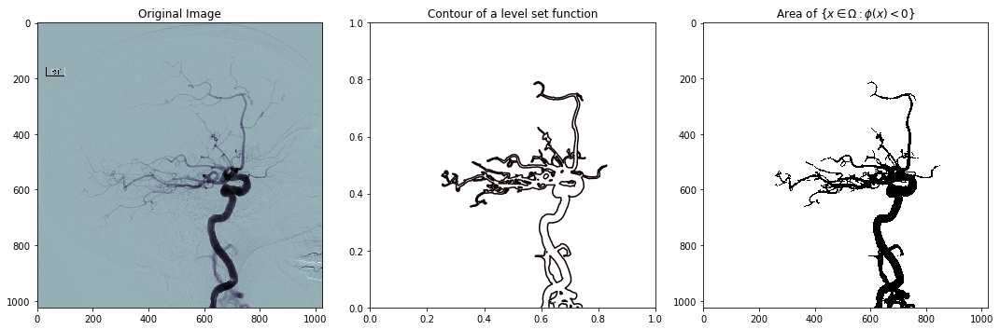

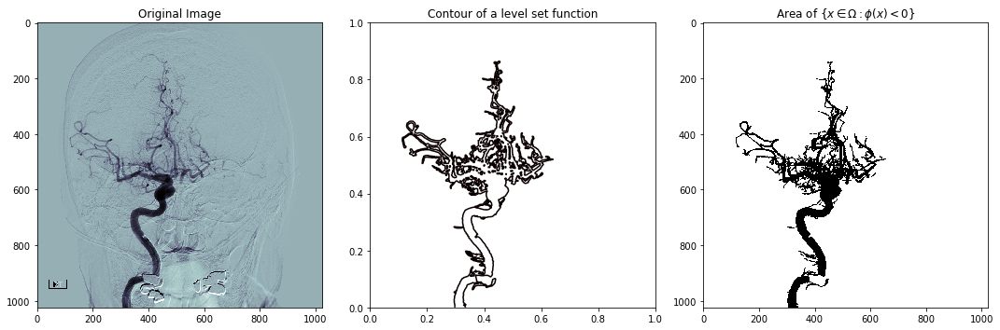

...

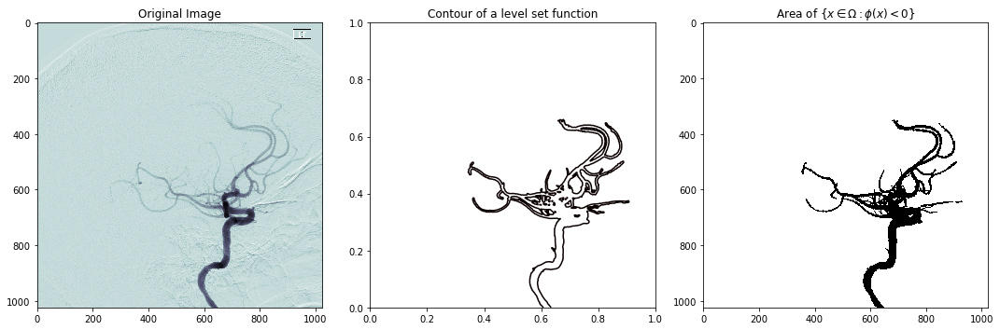

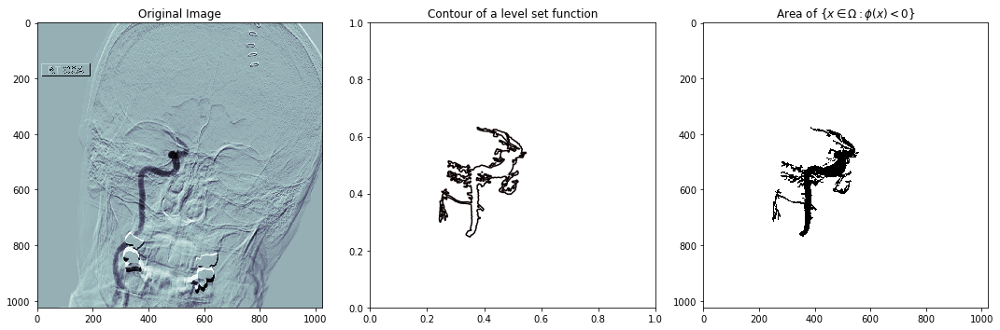

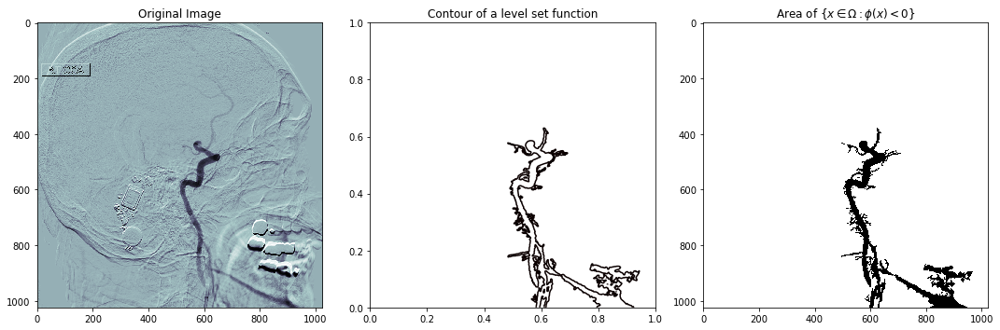

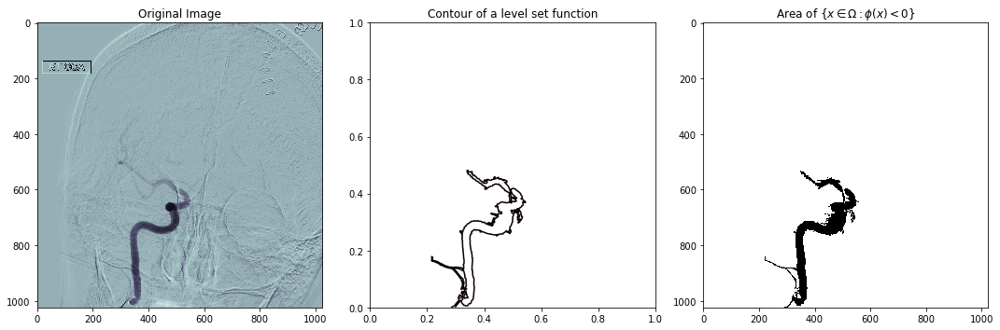

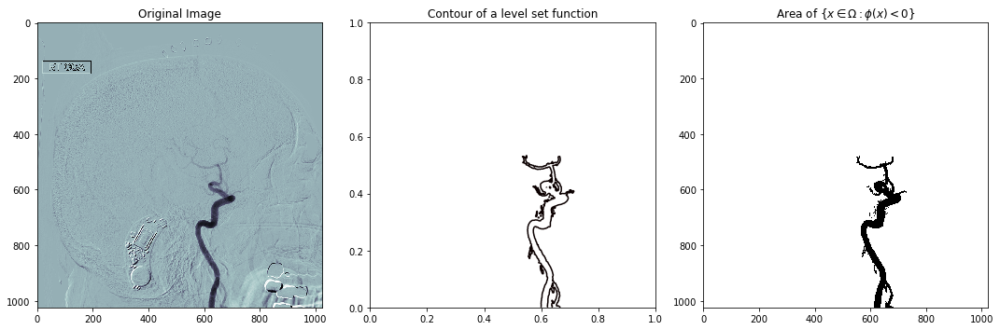

In [ ]:
# Run a method
max_iter = 600 # Maximum iterations
print_every = -1 # Verbose. Print every [print_every] iteration. It won't print out if -1
step_size = 500 # step size of the method


from glob import glob
image_files = sorted(list(glob('/Users/wonjunlee/Downloads/dsa vessels/data/*.png')))

for image_dir in image_files:
    # Importing images
    original_image = mpimg.imread(image_dir)
    image = cv2.resize(original_image, (n2,n1))
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        
    # Apply Gaussian filter
    gaussian_sigma = 1
    image = gaussian_filter(image, sigma=gaussian_sigma)
    
    # initailize phi based on an image.
    # It will find the center of mass using a smoothing method.
    lsm.initialize_phi(image)

    # Run a method.
    phi = run_lsm(image, lsm, step_size=step_size, max_iter=max_iter, print_every=print_every, do_plot=False)
    
    plot_result(original_image, phi)